* HCAv1 to newly generated data (non-CCS cells)
* Myeloid cells will be updated at a later step
* CCS cells will be updated at later steps

## Import modules

In [1]:
import numpy as np
import numpy.random as random
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
from scnym.api import scnym_api

In [2]:
import session_info
session_info.show()

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white', color_map = 'RdPu',)

## Function

In [4]:
def subsample(adata, fraction, groupby=None, min_n=0, max_n=10000, method='random', index_only=False, random_state=0):
    if method not in ('random', 'top'):
        raise NotImplementedError(f'method={method} unsupported')
    if groupby:
        if groupby not in adata.obs.columns:
            raise KeyError(f'{groupby} is not a valid obs annotation.')
        groups = adata.obs[groupby].unique()
        n_obs_per_group = {}
        sampled_obs_names = []
        for grp in groups:
            k = adata.obs[groupby] == grp
            grp_size = sum(k)
            ds_grp_size = int(min(
                max_n, max(np.ceil(grp_size * fraction), min(min_n, grp_size))))
            if method == 'top':
                idx = np.argsort(-adata.obs.loc[k, 'n_counts'].values)[0:ds_grp_size]
            else:
                np.random.seed(random_state)
                idx = np.random.choice(grp_size, ds_grp_size, replace=False)
            sampled_obs_names.extend(list(adata.obs_names[k][idx]))
    else:
        ds_size = int(adata.n_obs * fraction)
        np.random.seed(random_state)
        idx = np.random.choice(adata.n_obs, ds_size, replace=False)
        sampled_obs_names = adata.obs_names[idx]

    if index_only:
        return sampled_obs_names
    else:
        return adata[adata.obs_names.isin(sampled_obs_names)].copy()

## Read in data

In [5]:
adata_dir = '/nfs/team205/heart/anndata_objects/8regions'

batch_key: Donor + Nuclei_or_Cells + Kit_10X

In [6]:
adata = sc.read_h5ad(f'{adata_dir}/RNA_adult-8reg_raw_rmdblcls_celltype-annotated.h5ad')
genename_column='gene_name_multiome-2'
adata

AnnData object with n_obs × n_vars = 629041 × 32732
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1'
    var: 'gene_name_scRNA-0', 'gene_name_snRNA-1', 'gene_name_multiome-2'
    uns: 'cell_state_HCAv1_colors', 'cell_type_colors', 'leiden_scVI_colors'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_continuous', 'latent_gene_encoding'
    obsp: 'connectivities', 'distances'

In [7]:
adata.X.data[:10]

array([1., 1., 1., 1., 2., 1., 1., 1., 5., 1.], dtype=float32)

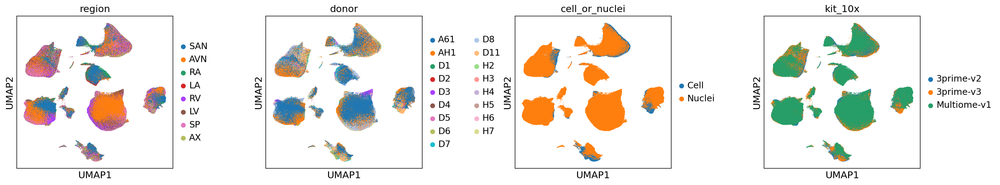

In [8]:
sc.pl.umap(adata, color=['region','donor','cell_or_nuclei','kit_10x'], size=2, wspace=0.45)

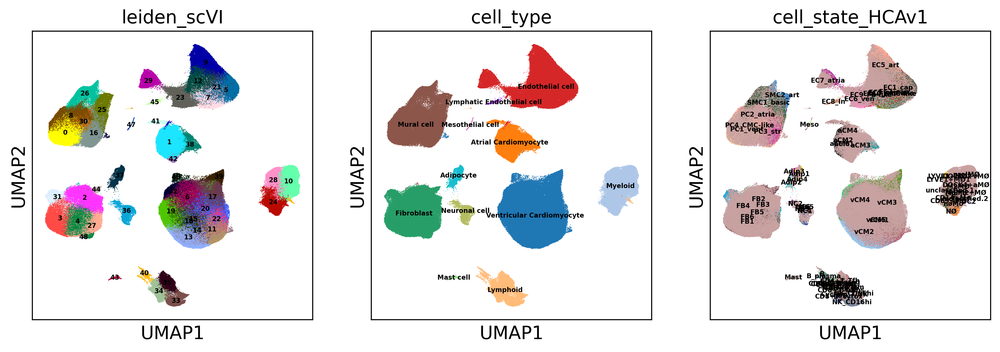

In [9]:
sc.settings.set_figure_params(dpi=200, facecolor='white', color_map = 'RdPu',)
sc.pl.umap(adata, color=['leiden_scVI','cell_type','cell_state_HCAv1'], size=1, wspace=0.1, legend_loc='on data', legend_fontsize=5)

## Cell states label transfer from scnRNA to Multiome

### 1) prepare reference data

In [12]:
ref=adata[adata.obs['cell_state_HCAv1'].isna()==False].copy()
ref

AnnData object with n_obs × n_vars = 413148 × 32732
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1'
    var: 'gene_name_scRNA-0', 'gene_name_snRNA-1', 'gene_name_multiome-2'
    uns: 'cell_state_HCAv1_colors', 'cell_type_colors', 'leiden_scVI_colors', 'region_colors', 'donor_colors', 'cell_or_nuclei_colors', 'kit_10x_colors'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_continuous', 'latent_gene_encoding'
    obsp: 'connectivities', 'distances'

In [13]:
# remove unclassified and normalise
ref=ref[ref.obs['cell_state_HCAv1'].isin(['unclassfied.1','unclassfied.2'])==False]

sc.pp.filter_genes(ref, min_cells=3)

sc.pp.normalize_total(ref, target_sum=1e4)
sc.pp.log1p(ref)
ref

filtered out 2787 genes that are detected in less than 3 cells


Trying to set attribute `.var` of view, copying.


normalizing counts per cell
    finished (0:00:02)


AnnData object with n_obs × n_vars = 412236 × 29945
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1'
    var: 'gene_name_scRNA-0', 'gene_name_snRNA-1', 'gene_name_multiome-2', 'n_cells'
    uns: 'cell_state_HCAv1_colors', 'cell_type_colors', 'leiden_scVI_colors', 'region_colors', 'donor_colors', 'cell_or_nuclei_colors', 'kit_10x_colors', 'log1p'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_continuous', 'latent_gene_encoding'
    obsp: 'connectivities', 'distances'

In [14]:
ref.obs['cell_state_HCAv1'].value_counts()

vCM1          70017
PC1_vent      46854
FB1           25633
vCM2          25497
EC1_cap       23759
              ...  
NC4              60
NC3              31
gdT              24
NC6              18
CD4+T_Th17        8
Name: cell_state_HCAv1, Length: 76, dtype: int64

In [15]:
# downsize for training
ref = subsample(ref, fraction=1, groupby='cell_state_HCAv1', min_n=0, max_n=2000, method='random', index_only=False, random_state=0)

In [16]:
ref.obs['cell_state_HCAv1'].value_counts()

FB5              2000
EC10_CMC-like    2000
NC1              2000
M2MØ             2000
vCM4             2000
                 ... 
NC4                60
NC3                31
gdT                24
NC6                18
CD4+T_Th17          8
Name: cell_state_HCAv1, Length: 76, dtype: int64

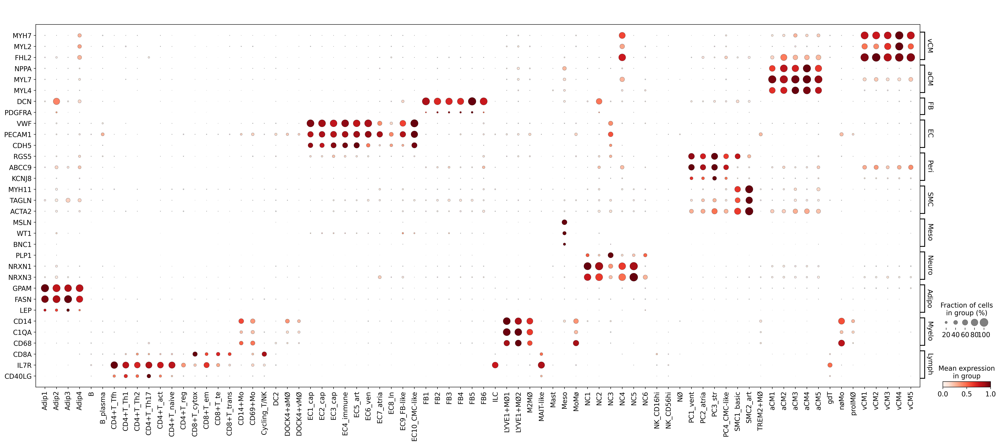

In [17]:
# sanity check
marker_genes_dict = {
    'vCM': ['MYH7', 'MYL2', 'FHL2'],
    'aCM': ['NPPA', 'MYL7', 'MYL4'],
    'FB': ['DCN', 'GCN', 'PDGFRA'],
    'EC': ['VWF', 'PECAM1', 'CDH5'],
    'Peri': ['RGS5', 'ABCC9', 'KCNJ8'],
    'SMC': ['MYH11', 'TAGLN', 'ACTA2'],
    'Meso': ['MSLN', 'WT1', 'BNC1'],
    'Neuro': ['PLP1', 'NRXN1', 'NRXN3'],
    'Adipo': ['GPAM', 'FASN', 'LEP'],
    'Myelo': ['CD14', 'C1QA', 'CD68'],
    'Lymph': ['CD8A', 'IL7R', 'CD40LG'],
}

for k, v in marker_genes_dict.items():
    marker_genes_dict[k] = [x for x in v if x in list(ref.var[genename_column])]
    
sc.pl.dotplot(ref, marker_genes_dict, 
              groupby='cell_state_HCAv1',
              gene_symbols=genename_column,
              dendrogram=False,
              # use_raw=True,
              standard_scale="var",
              color_map="Reds",
             swap_axes=True)

In [18]:
ref.X.data[:10]

array([1.138551 , 1.138551 , 1.138551 , 1.6571765, 1.6571765, 1.138551 ,
       1.138551 , 1.138551 , 1.138551 , 1.996973 ], dtype=float32)

### 2) Train

In [19]:
%%time
scnym_api(
    adata=ref,
    task='train',
    groupby='cell_state_HCAv1',
    out_path='/nfs/team205/heart/scnym/model_HCAv1_cell_states',
    config='new_identity_discovery',
)

No CUDA device found.
Computations will be performed on the CPU.
Add a CUDA compute device to improve speed dramatically.

No unlabeled data was found.
Did you forget to set some examples as `"Unlabeled"`?
Proceeding with purely supervised training.

X:  (88465, 29945)
y:  (88465,)
Not weighting classes and not balancing classes.
Found 2 unique domains.
Training...
Saving best model weights..._____________|
Saved best weights.
Saving best model weights..._____________|
Saved best weights.
>>>>> 47/99|--------------________________|
Early stopping at epoch 47
>>>>>
Training complete.

Evaluating model.
EVAL LOSS:  0.81163352898189
EVAL ACC :  0.7383293771900079
Predictions | Labels
[[61 61]
 [61 61]
 [61 61]
 [61 60]
 [61 60]
 [61 61]
 [46 46]
 [40 40]
 [40 40]
 [61 61]
 [46 46]
 [42 42]
 [42 40]
 [46 46]
 [40 40]]
CPU times: user 3h 35min 9s, sys: 56min 42s, total: 4h 31min 51s
Wall time: 55min 24s


### 3) Predict

In [10]:
que = adata[adata.obs['cell_state_HCAv1'].isna()].copy()

sc.pp.normalize_total(que, target_sum=1e4)
sc.pp.log1p(que)

que

normalizing counts per cell
    finished (0:00:02)


AnnData object with n_obs × n_vars = 218069 × 32732
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1'
    var: 'gene_name_scRNA-0', 'gene_name_snRNA-1', 'gene_name_multiome-2'
    uns: 'cell_state_HCAv1_colors', 'cell_type_colors', 'leiden_scVI_colors', 'region_colors', 'donor_colors', 'cell_or_nuclei_colors', 'kit_10x_colors', 'log1p'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_continuous', 'latent_gene_encoding'
    obsp: 'connectivities', 'distances'

In [11]:
scnym_api(
    adata=que,
    task='predict',
    key_added='cell_state_scNym',
    config='new_identity_discovery',
    trained_model='/nfs/team205/heart/scnym/model_HCAv1_cell_states',
)

No CUDA device found.
Computations will be performed on the CPU.
Add a CUDA compute device to improve speed dramatically.

Loaded model predicting 76 classes from 29945 features
['Adip1' 'Adip2' 'Adip3' 'Adip4' 'B' 'B_plasma' 'CD14+Mo' 'CD4+T_Tfh'
 'CD4+T_Th1' 'CD4+T_Th17' 'CD4+T_Th2' 'CD4+T_act' 'CD4+T_naive'
 'CD4+T_reg' 'CD69+Mo' 'CD8+T_cytox' 'CD8+T_em' 'CD8+T_te' 'CD8+T_trans'
 'Cycling_T/NK' 'DC2' 'DOCK4+aMØ' 'DOCK4+vMØ' 'EC10_CMC-like' 'EC1_cap'
 'EC2_cap' 'EC3_cap' 'EC4_immune' 'EC5_art' 'EC6_ven' 'EC7_atria' 'EC8_ln'
 'EC9_FB-like' 'FB1' 'FB2' 'FB3' 'FB4' 'FB5' 'FB6' 'ILC' 'LYVE1+MØ1'
 'LYVE1+MØ2' 'M2MØ' 'MAIT-like' 'Mast' 'Meso' 'MoMø' 'NC1' 'NC2' 'NC3'
 'NC4' 'NC5' 'NC6' 'NK_CD16hi' 'NK_CD56hi' 'NØ' 'PC1_vent' 'PC2_atria'
 'PC3_str' 'PC4_CMC-like' 'SMC1_basic' 'SMC2_art' 'TREM2+MØ' 'aCM1' 'aCM2'
 'aCM3' 'aCM4' 'aCM5' 'gdT' 'nøMo' 'proIMØ' 'vCM1' 'vCM2' 'vCM3' 'vCM4'
 'vCM5']
Building a classification matrix...


mapping genes: 32732it [00:35, 924.12it/s] 
Finding cell types:   0%|          | 0/213 [00:00<?, ?it/s]

Found 29945 common genes.
Predicting cell types...


Finding cell types: 100%|██████████| 213/213 [01:07<00:00,  3.13it/s]


Extracting model embeddings...


In [12]:
# que.write('')

In [13]:
que.obs[['region','cell_state_scNym_confidence']].groupby('region').mean()

,cell_state_scNym_confidence
region,
SAN,0.829315
AVN,0.697396
RA,0.829130
LA,0.803859
RV,0.731755
LV,0.732685
SP,0.716338
AX,0.711013


In [14]:
adata.obs = adata.obs.reset_index().merge(que.obs[['cell_state_scNym','cell_state_scNym_confidence']].reset_index(),how='left',on='barcode').set_index('barcode')
adata.obs

,sangerID,combinedID,donor,donor_type,region,region_finest,age,gender,facility,cell_or_nuclei,...,scrublet_leiden,cluster_scrublet_score,doublet_pval,doublet_bh_pval,batch_key,leiden_scVI,cell_type,cell_state_HCAv1,cell_state_scNym,cell_state_scNym_confidence
barcode,,,,,,,,,,,,,,,,,,,,,
HCAHeart7606896_GATGAGGCACGGCTAC,HCAHeart7606896,na,D1,DBD,AX,AX,50-55,Female,Sanger,Cell,...,"2,0",0.184933,0.084434,0.832720,D1_Cell_3prime-v2,21,Endothelial cell,EC5_art,NaN,NaN
HCAHeart7606896_CGCTTCACATTTGCCC,HCAHeart7606896,na,D1,DBD,AX,AX,50-55,Female,Sanger,Cell,...,"5,0",0.127308,0.438473,0.832720,D1_Cell_3prime-v2,25,Mural cell,SMC2_art,NaN,NaN
HCAHeart7606896_GTTAAGCAGAGACTAT,HCAHeart7606896,na,D1,DBD,AX,AX,50-55,Female,Sanger,Cell,...,"2,0",0.184933,0.084434,0.832720,D1_Cell_3prime-v2,9,Endothelial cell,EC5_art,NaN,NaN
HCAHeart7606896_TCGCGTTGTAAGAGGA,HCAHeart7606896,na,D1,DBD,AX,AX,50-55,Female,Sanger,Cell,...,"0,0",0.134615,0.378401,0.832720,D1_Cell_3prime-v2,16,Mural cell,PC2_atria,NaN,NaN
HCAHeart7606896_GCTGCGAGTGTTGGGA,HCAHeart7606896,na,D1,DBD,AX,AX,50-55,Female,Sanger,Cell,...,"2,0",0.184933,0.084434,0.832720,D1_Cell_3prime-v2,9,Endothelial cell,EC5_art,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HCAHeartST11350187_HCAHeartST11121845_CAAGTGAAGTATTGTG-1,HCAHeartST11350187,HCAHeartST11350187_HCAHeartST11121845,A61,DCD,SAN,SAN MID,nan,Female,Sanger,Nuclei,...,"0,8",0.097493,0.425366,0.878788,A61_Nuclei_Multiome-v1,2,Fibroblast,NaN,FB4,0.879913
HCAHeartST11350187_HCAHeartST11121845_ATCCGTGAGGCACAGG-1,HCAHeartST11350187,HCAHeartST11350187_HCAHeartST11121845,A61,DCD,SAN,SAN MID,nan,Female,Sanger,Nuclei,...,"5,0",0.035176,0.929371,0.957921,A61_Nuclei_Multiome-v1,12,Endothelial cell,NaN,EC3_cap,0.372231
HCAHeartST11350187_HCAHeartST11121845_AGTAGCTTCATGAGCT-1,HCAHeartST11350187,HCAHeartST11350187_HCAHeartST11121845,AH1,DCD,SAN,SAN MID,nan,Female,Sanger,Nuclei,...,"0,5",0.078049,0.629131,0.935631,AH1_Nuclei_Multiome-v1,2,Fibroblast,NaN,FB3,0.956898


... storing 'cell_state_scNym' as categorical


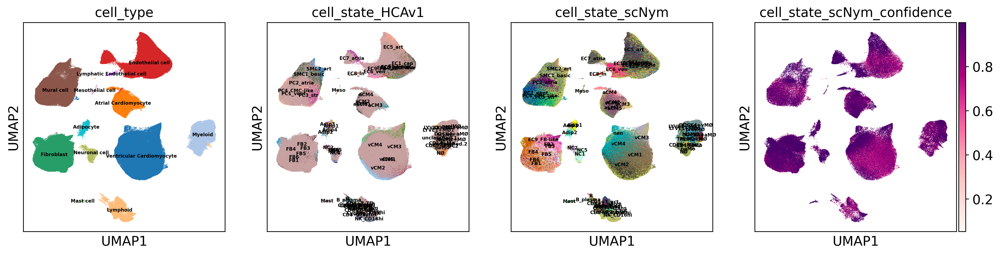

In [15]:
sc.settings.set_figure_params(dpi=200, facecolor='white', color_map = 'RdPu',)
sc.pl.umap(adata, color=['cell_type','cell_state_HCAv1','cell_state_scNym','cell_state_scNym_confidence'], size=1, wspace=0.1, legend_loc='on data', legend_fontsize=5)

In [16]:
adata.write(f'{adata_dir}/RNA_adult-8reg_raw_rmdblcls_celltype-annotated.h5ad')

In [17]:
f'{adata_dir}/RNA_adult-8reg_raw_rmdblcls_celltype-annotated.h5ad'

'/nfs/team205/heart/anndata_objects/8regions/RNA_adult-8reg_raw_rmdblcls_celltype-annotated.h5ad'

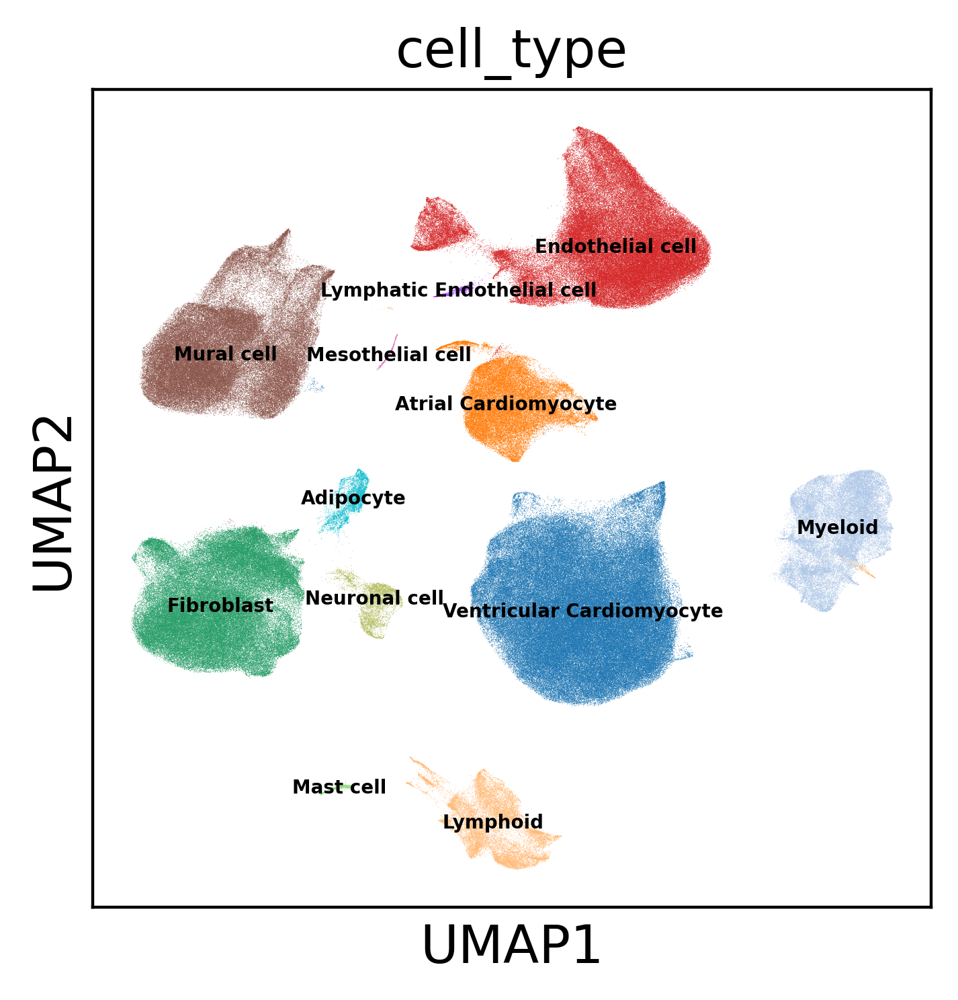

In [18]:
sc.settings.set_figure_params(dpi=200, facecolor='white', color_map = 'RdPu',)
sc.pl.umap(adata, color=['cell_type'], size=0.1, legend_loc='on data', legend_fontsize=5)

## Checking

In [8]:
import seaborn as sns

# read previous annotation
import pickle
def read_pkl(file):
    with open(file, "rb") as tf:
        obj = pickle.load(tf)
    
    return obj

In [4]:
adata_dir = '/nfs/team205/heart/anndata_objects/8regions'

batch_key: Donor + Nuclei_or_Cells + Kit_10X

In [5]:
adata = sc.read_h5ad(f'{adata_dir}/RNA_adult-8reg_raw_rmdblcls_celltype-annotated.h5ad')
genename_column='gene_name_multiome-2'
adata

AnnData object with n_obs × n_vars = 629041 × 32732
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence'
    var: 'gene_name_scRNA-0', 'gene_name_snRNA-1', 'gene_name_multiome-2'
    uns: 'cell_or_nuclei_colors', 'cell_state_HCAv1_colors', 'cell_state_scNym_colors', 'cell_type_colors', 'donor_colors', 'kit_10x_colors', 'leiden_scVI_colors', 'region_colors'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_continuous', 'latent_gene_encoding'
    obsp: 'connectivities', 'distances'

In [19]:
# Check cell states are not missing here compared with the previous object
cells_dict=read_pkl('/nfs/team205/kk18/data/anndata/cellstatenew_dict.pkl')

for c in cells_dict.keys():
    inters = set(adata.obs_names).intersection(cells_dict[c])
    cells_dict[c]=len(inters)/len(cells_dict[c])
    
sorted(cells_dict.items(),key=lambda item: item[1])

[('EC9_FB-like', 0.47368421052631576),
 ('PC4_CMC-like', 0.49195710455764075),
 ('NC4', 0.5263157894736842),
 ('Mast', 0.5654008438818565),
 ('CD8+T_trans', 0.6326845844918134),
 ('CD8+T_em', 0.6773279352226721),
 ('CD4+T_act', 0.6876701672500972),
 ('NC3', 0.6923076923076923),
 ('NC1', 0.7219366605869674),
 ('aCM5', 0.7258064516129032),
 ('EC1_cap', 0.7348957159668494),
 ('B_plasma', 0.7363896848137536),
 ('CD8+T_cytox', 0.7404737384140062),
 ('CD16+Mo_cycling', 0.7674418604651163),
 ('NK_CD16hi', 0.7713979482468228),
 ('MoMP_cycling', 0.7794117647058824),
 ('CD16+Mo', 0.7862647325475974),
 ('Adip4', 0.7887323943661971),
 ('CD14+Mo', 0.7906155398587286),
 ('NCsan', 0.8),
 ('LYVE1+IGF1-MP', 0.8029912325941206),
 ('LYVE1+IGF1-MP_cycling', 0.804005722460658),
 ('cDC', 0.8109647561409754),
 ('MAIT-like', 0.8111888111888111),
 ('EC4_immune', 0.8114261621165806),
 ('NK_CD56hi', 0.816688567674113),
 ('MoMP', 0.82671272308578),
 ('EC8_ln', 0.8336397058823529),
 ('aCM4', 0.8352470424495476),
 

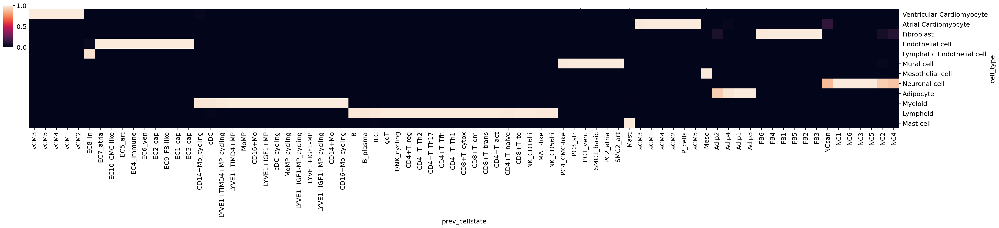

In [21]:
cells_dict=read_pkl('/nfs/team205/kk18/data/anndata/cellstatenew_dict.pkl')
d = {x:k for k,v in cells_dict.items() for x in v}

df = adata.obs.copy()
df = df.reset_index().merge(pd.DataFrame(d.items(),columns=['barcode','prev_cellstate'],),how='left',on='barcode')

# cross table with previous annotation
df = pd.crosstab(df['cell_type'],df['prev_cellstate'],normalize='columns')
sns.clustermap(df,row_cluster=False,dendrogram_ratio=0.01,figsize=(30, 7),cbar_pos=(-0.01, 0.8, 0.01, 0.18))

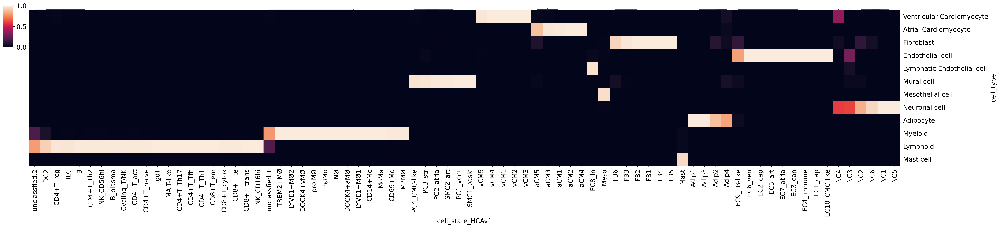

In [29]:
# cross table with HCAv1
df = pd.crosstab(adata.obs['cell_type'],adata.obs['cell_state_HCAv1'],normalize='columns')
sns.clustermap(df,row_cluster=False,dendrogram_ratio=0.01,figsize=(30, 7),cbar_pos=(-0.01, 0.8, 0.01, 0.18))

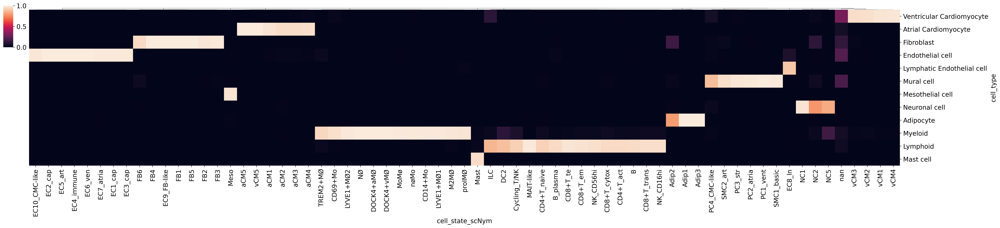

In [30]:
# cross table with scNym
df = pd.crosstab(adata.obs['cell_type'],adata.obs['cell_state_scNym'],normalize='columns')
sns.clustermap(df,row_cluster=False,dendrogram_ratio=0.01,figsize=(30, 7),cbar_pos=(-0.01, 0.8, 0.01, 0.18))